# 🌍 EcoRevive Model Testing Script
## Testing phase2_epoch_5.pth with Earth Engine Integration

This notebook supports **two testing modes**:
1. **Local Files**: Test on downloaded GeoTIFF files
2. **Earth Engine**: Fetch images directly from Google Earth Engine

Both use the **exact same preprocessing pipeline** as training.

In [11]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from refined_model import RefinedEcoReviveModel

# For local file testing
import rasterio

# For Earth Engine testing
import ee
import requests
from rasterio.io import MemoryFile

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

PyTorch version: 2.7.0.dev20250124
CUDA available: False
Using device: cpu


In [12]:
# ==================== EARTH ENGINE SETUP ====================

EE_PROJECT_ID = 'hale-life-482914-r0'  # Your project ID

try:
    ee.Initialize(project=EE_PROJECT_ID)
    print("✅ Google Earth Engine initialized")
except Exception as e:
    print("🔐 Authentication required...")
    ee.Authenticate()
    ee.Initialize(project=EE_PROJECT_ID)
    print("✅ Google Earth Engine initialized")

# Hansen forest dataset and Sentinel-2 bands (same as finalData.py)
hansen = ee.Image('UMD/hansen/global_forest_change_2024_v1_12')
BANDS = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']

✅ Google Earth Engine initialized


In [13]:
# ==================== PREPROCESSING FUNCTIONS ====================
# IDENTICAL to dataset.py for consistency

# Band statistics from dataset.py (lines 26-27)
BAND_MEANS = np.array([1500, 1400, 1300, 1200, 1500, 2000, 2200, 2300, 2500, 800], dtype=np.float32)
BAND_STDS = np.array([1000, 1100, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 900], dtype=np.float32)

def normalize_image(image):
    """
    EXACT normalization from dataset.py (lines 62-78)
    
    Args:
        image: numpy array of shape (10, H, W) with raw Sentinel-2 values
    
    Returns:
        Normalized image in range [0, 1]
    """
    # Step 1: Clip extreme values
    image = np.clip(image, 0, 10000)
    
    # Step 2: Standardize per band
    image = image.astype(np.float32)
    for i in range(10):
        image[i] = (image[i] - BAND_MEANS[i]) / (BAND_STDS[i] + 1e-6)
    
    # Step 3: Clip to reasonable range
    image = np.clip(image, -3, 3)
    
    # Step 4: Scale to [0, 1]
    image = (image + 3) / 6
    
    return image

def create_rgb_preview(image_raw):
    """
    Create RGB preview from raw Sentinel-2 data
    Uses bands B4 (Red), B3 (Green), B2 (Blue) = indices 2, 1, 0
    """
    rgb = np.stack([image_raw[2], image_raw[1], image_raw[0]], axis=-1)
    
    # Normalize with gamma correction for better visualization
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-6)
    rgb = np.power(rgb, 1/1.3)  # Gamma correction
    
    return rgb

print("✅ Preprocessing functions loaded")

✅ Preprocessing functions loaded


In [14]:
# ==================== LOAD MODEL ====================

# Use v2 calibration (+8.0) for better deforestation detection
# This version is more sensitive and will highlight more degraded areas
model_path = "phase2_epoch_5_calibrated_v2.pth"

# Fallback options
import os
if not os.path.exists(model_path):
    print("⚠️  v2 calibrated model not found, trying v1...")
    model_path = "phase2_epoch_5_calibrated.pth"
    if not os.path.exists(model_path):
        print("⚠️  Using original model")
        model_path = "phase2_epoch_5.pth"

print(f"Loading model from: {model_path}")
model = RefinedEcoReviveModel(device=str(device))
model.load_weights(model_path)
model.eval()

print(f"✅ Model loaded successfully")
print(f"   Total parameters: {sum(p.numel() for p in model.parameters()):,}")

Loading model from: phase2_epoch_5_calibrated_v2.pth
✅ Weights loaded successfully
✅ Model loaded successfully
   Total parameters: 13,658,065


In [15]:
# ==================== EARTH ENGINE IMAGE FETCHING ====================

def fetch_ee_image(lat, lon, name, date_start='2023-01-01', date_end='2023-12-31', cloud_pct=10):
    """
    Fetch Sentinel-2 image from Earth Engine
    
    Args:
        lat: Latitude
        lon: Longitude
        name: Location name for display
        date_start: Start date for image collection
        date_end: End date for image collection
        cloud_pct: Maximum cloud percentage
    
    Returns:
        image_raw: Raw Sentinel-2 data (10, 256, 256)
        None (for compatibility with local file function)
    """
    print(f"🌍 Fetching image for: {name} ({lat}, {lon})...")
    
    # Create region (1280m buffer = ~256 pixels at 10m resolution)
    point = ee.Geometry.Point([lon, lat])
    region = point.buffer(1280).bounds()
    
    # Fetch Sentinel-2 data (same as finalData.py)
    s2 = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
        .filterBounds(point) \
        .filterDate(date_start, date_end) \
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', cloud_pct)) \
        .median() \
        .select(BANDS)
    
    # Add dummy label band (required for download format)
    stack = s2.addBands(ee.Image.constant(0).rename('label'))
    
    try:
        # Download image
        url = stack.getDownloadURL({
            'scale': 10,
            'region': region,
            'format': 'GEO_TIFF',
            'crs': 'EPSG:3857'
        })
        
        response = requests.get(url)
        
        # Read with rasterio from memory
        with MemoryFile(response.content) as memfile:
            with memfile.open() as src:
                data = src.read()  # (11, H, W)
        
        # Crop to 256×256 from center
        c, h, w = data.shape
        cy, cx = h // 2, w // 2
        
        # Extract 256×256 patch
        if h >= 256 and w >= 256:
            img = data[:10, cy-128:cy+128, cx-128:cx+128]
        else:
            # Pad if too small
            img = np.zeros((10, 256, 256), dtype=data.dtype)
            start_y = max(0, cy - 128)
            start_x = max(0, cx - 128)
            end_y = min(h, cy + 128)
            end_x = min(w, cx + 128)
            img[:, :end_y-start_y, :end_x-start_x] = data[:10, start_y:end_y, start_x:end_x]
        
        # Handle NaN/Inf
        img = np.nan_to_num(img, nan=0.0, posinf=10000.0, neginf=0.0)
        
        print(f"✅ Image fetched successfully")
        print(f"   Shape: {img.shape}")
        print(f"   Value range: [{img.min()}, {img.max()}]")
        
        return img, None
        
    except Exception as e:
        print(f"❌ Error fetching image: {e}")
        return None, None

print("✅ Earth Engine fetch function ready")

✅ Earth Engine fetch function ready


In [16]:
# ==================== LOCAL FILE LOADING ====================

def load_local_geotiff(tiff_path):
    """
    Load GeoTIFF from local file (same as original implementation)
    
    Args:
        tiff_path: Path to .tif file (11 bands)
    
    Returns:
        image_raw: Raw Sentinel-2 data (10, 256, 256)
        label: Ground truth label (256, 256)
    """
    with rasterio.open(tiff_path) as src:
        data = src.read()  # Shape: (11, H, W)
        
        # Pad to 256×256 if needed
        _, h, w = data.shape
        if h != 256 or w != 256:
            padded_data = np.zeros((11, 256, 256), dtype=data.dtype)
            actual_h = min(h, 256)
            actual_w = min(w, 256)
            padded_data[:, :actual_h, :actual_w] = data[:, :actual_h, :actual_w]
            data = padded_data
    
    # Extract bands
    image = data[0:10, :, :]
    label = data[10, :, :]
    
    # Handle NaN/Inf
    image = np.nan_to_num(image, nan=0.0, posinf=10000.0, neginf=0.0)
    label = np.nan_to_num(label, nan=0.0)
    
    return image, label

print("✅ Local file loading function ready")

✅ Local file loading function ready


In [17]:
# ==================== INFERENCE & VISUALIZATION ====================

def run_inference_and_visualize(image_raw, label, name):
    """
    Run model inference and create visualization
    
    Args:
        image_raw: Raw Sentinel-2 data (10, 256, 256)
        label: Ground truth (256, 256) or None
        name: Location name for display
    """
    # Create RGB preview BEFORE normalization
    rgb_preview = create_rgb_preview(image_raw)
    
    # Normalize image (EXACT same as dataset.py)
    image_normalized = normalize_image(image_raw)
    
    # Convert to tensor
    image_tensor = torch.from_numpy(image_normalized).float().unsqueeze(0).to(device)
    
    # Run inference
    with torch.no_grad():
        logits = model(image_tensor)
        prediction = torch.sigmoid(logits).cpu().numpy()[0, 0]  # (256, 256)
    
    print(f"✅ Inference complete")
    print(f"   Prediction range: [{prediction.min():.4f}, {prediction.max():.4f}]")
    print(f"   Mean prediction: {prediction.mean():.4f}")
    print(f"   Degraded pixels (>0.5): {(prediction > 0.5).mean():.2%}")
    
    # Create overlay for actionable view
    overlay = np.zeros((*prediction.shape, 4))  # RGBA
    overlay[prediction > 0.5] = [1.0, 0.0, 0.0, 0.4]  # Red with 40% opacity
    
    # Visualize
    if label is not None:
        # 4-panel view with ground truth
        fig, axes = plt.subplots(2, 2, figsize=(14, 14))
        
        axes[0, 0].imshow(rgb_preview)
        axes[0, 0].set_title(f'{name}\nSatellite View (RGB)', fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(label, cmap='RdYlGn_r', vmin=0, vmax=1)
        axes[0, 1].set_title(f'Ground Truth\n(Degraded: {label.mean():.2%})', fontsize=12, fontweight='bold')
        axes[0, 1].axis('off')
        
        im = axes[1, 0].imshow(prediction, cmap='RdYlGn_r', vmin=0, vmax=1)
        axes[1, 0].set_title('AI Prediction\n(Green=Healthy, Red=Degraded)', fontsize=12, fontweight='bold')
        axes[1, 0].axis('off')
        plt.colorbar(im, ax=axes[1, 0], fraction=0.046, pad=0.04)
        
        axes[1, 1].imshow(rgb_preview)
        axes[1, 1].imshow(overlay)
        axes[1, 1].set_title('Action Map\n(Red Highlights = Degradation)', fontsize=12, fontweight='bold')
        axes[1, 1].axis('off')
        
        # Calculate metrics
        binary_pred = (prediction > 0.5).astype(float)
        gt_binary = (label > 0.5).astype(float)
        accuracy = (binary_pred == gt_binary).mean()
        
        intersection = (binary_pred * gt_binary).sum()
        union = binary_pred.sum() + gt_binary.sum() - intersection
        iou = intersection / (union + 1e-6)
        
        print(f"\n📊 Metrics:")
        print(f"   Pixel Accuracy: {accuracy:.2%}")
        print(f"   IoU (Degraded): {iou:.4f}")
    else:
        # 3-panel view without ground truth
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(rgb_preview)
        axes[0].set_title(f'{name}\nReal Satellite View', fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        im = axes[1].imshow(prediction, cmap='RdYlGn_r', vmin=0, vmax=1)
        axes[1].set_title('AI Analysis\n(Green=Healthy, Red=Damaged)', fontsize=14, fontweight='bold')
        axes[1].axis('off')
        cbar = plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
        cbar.set_ticks([0, 0.5, 1])
        cbar.set_ticklabels(['Healthy', 'Risk', 'Degraded'])
        
        axes[2].imshow(rgb_preview)
        axes[2].imshow(overlay)
        axes[2].set_title('Action Map\n(Red Highlights = Degradation)', fontsize=14, fontweight='bold')
        axes[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'test_result_{name.replace(" ", "_")}.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"\n✅ Results saved to: test_result_{name.replace(' ', '_')}.png")

print("✅ Inference and visualization functions ready")

✅ Inference and visualization functions ready


---
## 🌐 MODE 1: Test with Earth Engine Images
Fetch images directly from Google Earth Engine


🌍 Fetching image for: Dixie Fire - Core Burn Scar (40.15, -120.85)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [0.0, 3340.5]
✅ Inference complete
   Prediction range: [0.0214, 1.0000]
   Mean prediction: 0.7245
   Degraded pixels (>0.5): 80.95%


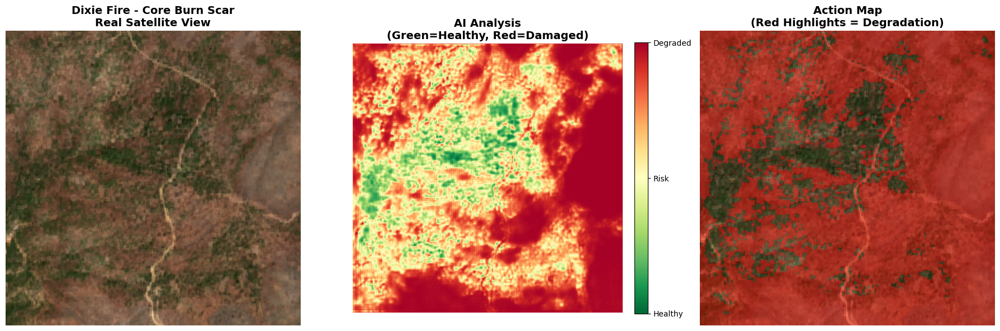


✅ Results saved to: test_result_Dixie_Fire_-_Core_Burn_Scar.png


🌍 Fetching image for: Dixie Fire - North Lassen Burn (40.35, -121.15)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [55.0, 3957.5]
✅ Inference complete
   Prediction range: [0.0393, 0.9967]
   Mean prediction: 0.7336
   Degraded pixels (>0.5): 75.72%


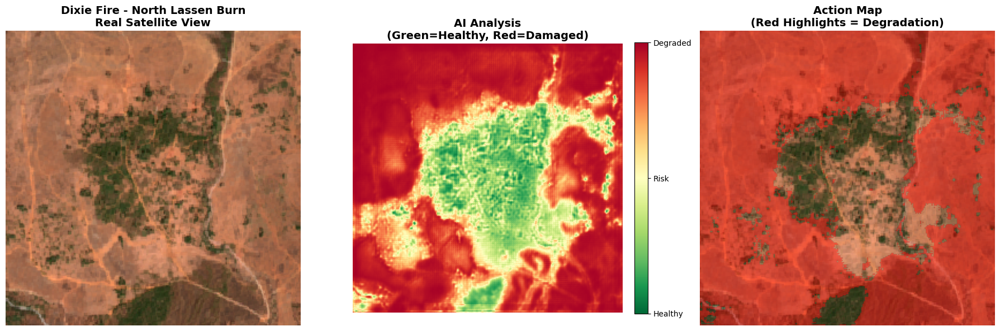


✅ Results saved to: test_result_Dixie_Fire_-_North_Lassen_Burn.png


🌍 Fetching image for: Dixie Fire - 2 Year Recovery (40.15, -120.85)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [17.0, 3898.0]
✅ Inference complete
   Prediction range: [0.0185, 0.9932]
   Mean prediction: 0.5647
   Degraded pixels (>0.5): 60.10%


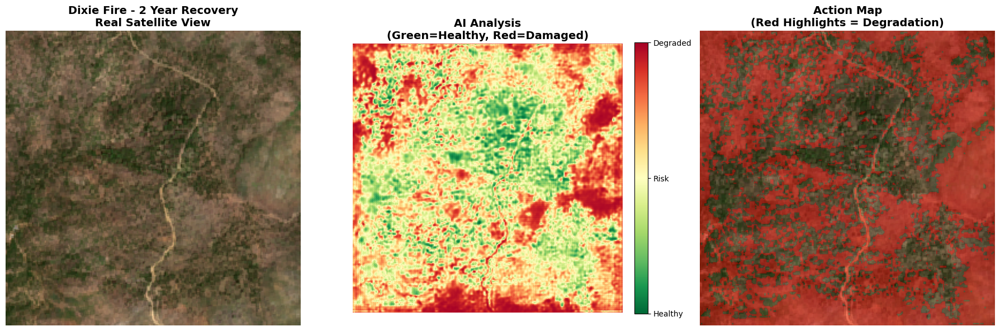


✅ Results saved to: test_result_Dixie_Fire_-_2_Year_Recovery.png


🌍 Fetching image for: Plumas Forest - Healthy (40.0, -121.3)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [0.0, 6644.0]
✅ Inference complete
   Prediction range: [0.0014, 0.9990]
   Mean prediction: 0.4864
   Degraded pixels (>0.5): 47.08%


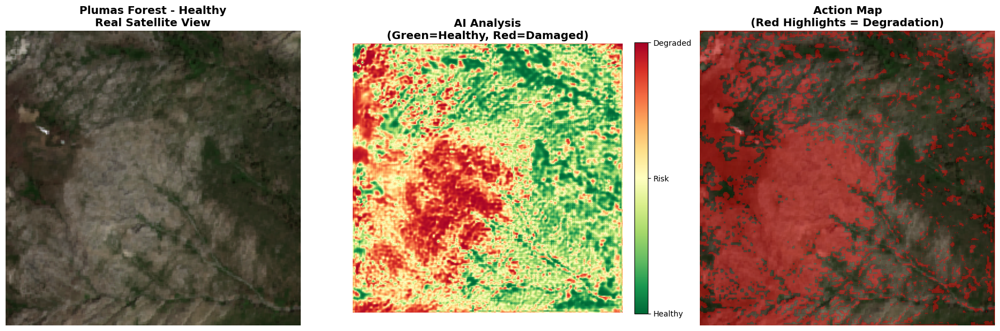


✅ Results saved to: test_result_Plumas_Forest_-_Healthy.png


🌍 Fetching image for: Barataria Bay - Severe Erosion (29.35, -90.1)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [52.0, 3112.0]
✅ Inference complete
   Prediction range: [0.0010, 0.8561]
   Mean prediction: 0.0817
   Degraded pixels (>0.5): 0.91%


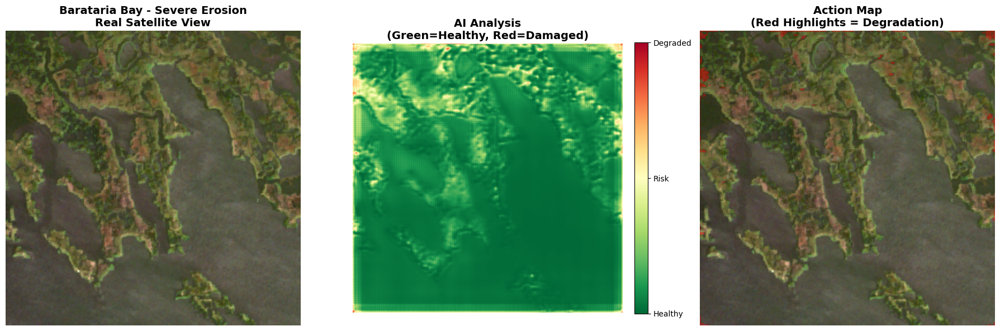


✅ Results saved to: test_result_Barataria_Bay_-_Severe_Erosion.png


🌍 Fetching image for: Terrebonne Parish - Land Loss (29.2, -90.75)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [138.5, 3928.0]
✅ Inference complete
   Prediction range: [0.0001, 0.9864]
   Mean prediction: 0.0890
   Degraded pixels (>0.5): 4.83%


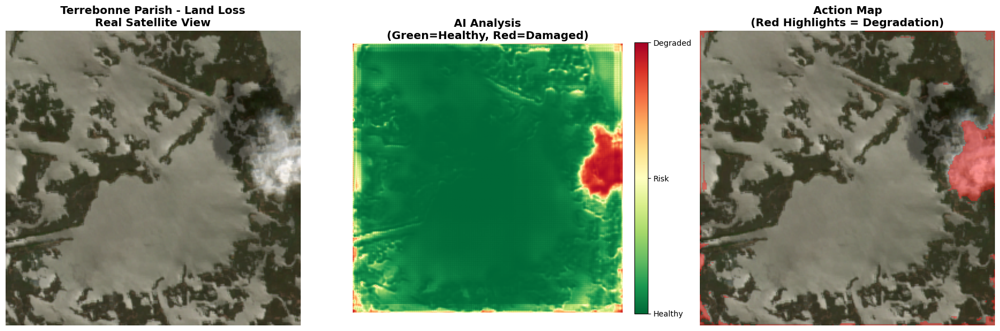


✅ Results saved to: test_result_Terrebonne_Parish_-_Land_Loss.png


🌍 Fetching image for: Breton Sound - Marsh Loss (29.5, -89.4)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [88.0, 1206.0]
✅ Inference complete
   Prediction range: [0.3183, 0.9867]
   Mean prediction: 0.6192
   Degraded pixels (>0.5): 84.95%


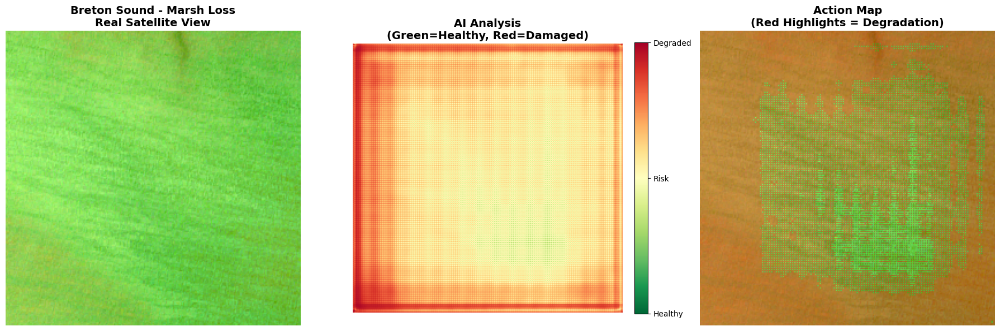


✅ Results saved to: test_result_Breton_Sound_-_Marsh_Loss.png


🌍 Fetching image for: Mississippi Delta - Saltwater (29.3, -89.25)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [61.0, 3480.0]
✅ Inference complete
   Prediction range: [0.0007, 0.9924]
   Mean prediction: 0.4215
   Degraded pixels (>0.5): 49.91%


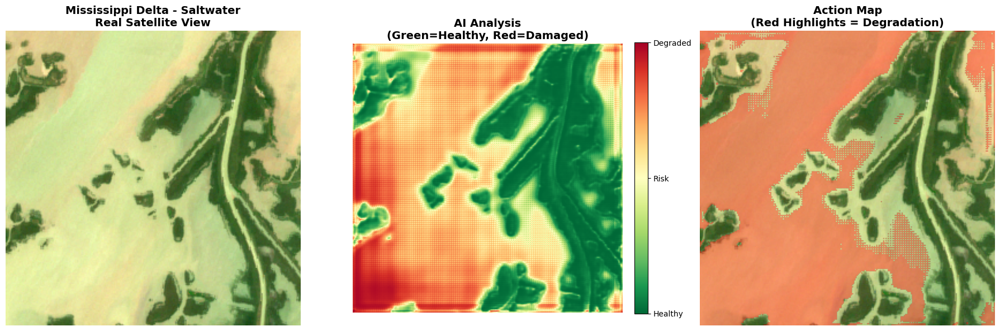


✅ Results saved to: test_result_Mississippi_Delta_-_Saltwater.png


🌍 Fetching image for: Jean Lafitte NP - Protected (29.75, -90.1)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [82.5, 5348.0]
✅ Inference complete
   Prediction range: [0.0001, 0.9921]
   Mean prediction: 0.0474
   Degraded pixels (>0.5): 1.97%


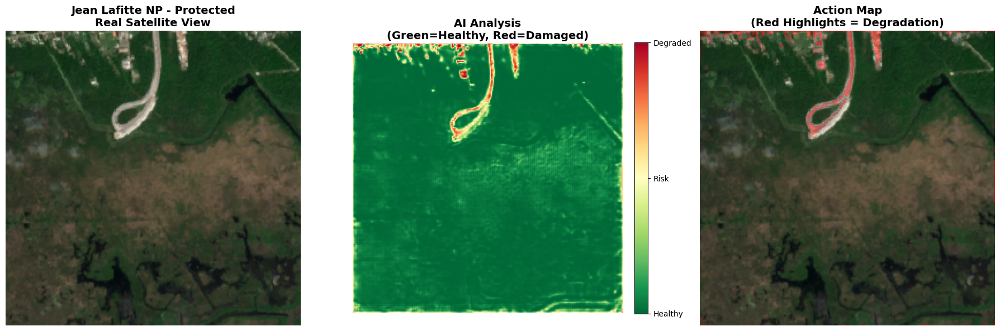


✅ Results saved to: test_result_Jean_Lafitte_NP_-_Protected.png


🌍 Fetching image for: Hurricane Ida - Cameron Parish (29.8, -93.0)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [185.5, 3540.0]
✅ Inference complete
   Prediction range: [0.0013, 0.9693]
   Mean prediction: 0.2442
   Degraded pixels (>0.5): 14.26%


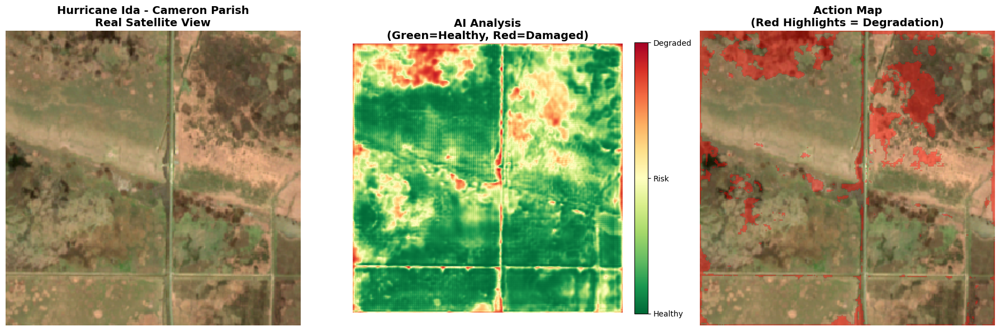


✅ Results saved to: test_result_Hurricane_Ida_-_Cameron_Parish.png



In [19]:
# ==================== TEST WITH EARTH ENGINE - MULTIPLE LOCATIONS ====================

# Recommended test locations (10 diverse examples)
test_locations = [
    # === DIXIE FIRE AREA ===
    (40.15, -120.85, "Dixie Fire - Core Burn Scar", '2022-06-01', '2022-09-01'),
    (40.35, -121.15, "Dixie Fire - North Lassen Burn", '2022-06-01', '2022-09-01'),
    (40.15, -120.85, "Dixie Fire - 2 Year Recovery", '2024-06-01', '2024-09-01'),
    (40.00, -121.30, "Plumas Forest - Healthy", '2024-06-01', '2024-09-01'),
    
    # === LOUISIANA WETLANDS ===
    (29.35, -90.10, "Barataria Bay - Severe Erosion", '2024-03-01', '2024-05-01'),
    (29.20, -90.75, "Terrebonne Parish - Land Loss", '2024-03-01', '2024-05-01'),
    (29.50, -89.40, "Breton Sound - Marsh Loss", '2024-03-01', '2024-05-01'),
    (29.30, -89.25, "Mississippi Delta - Saltwater", '2024-03-01', '2024-05-01'),
    (29.75, -90.10, "Jean Lafitte NP - Protected", '2024-03-01', '2024-05-01'),
    (29.80, -93.00, "Hurricane Ida - Cameron Parish", '2022-03-01', '2022-05-01'),
]

for lat, lon, name, date_start, date_end in test_locations:
    print(f"\n{'='*70}")
    image_raw, _ = fetch_ee_image(lat, lon, name, date_start, date_end)
    
    if image_raw is not None:
        run_inference_and_visualize(image_raw, None, name)
    
    print(f"{'='*70}\n")

---
## 🔬 Final Model Validation Test
Comprehensive evaluation on 10 diverse locations with expert predictions vs model predictions

In [20]:
# ==================== FINAL MODEL VALIDATION TEST ====================
# Testing calibrated model (v2) on 10 diverse locations
# Comparing expert predictions vs model predictions

import pandas as pd
from IPython.display import display

print("="*80)
print("🔬 FINAL MODEL VALIDATION TEST")
print("="*80)
print(f"Testing model: phase2_epoch_5_calibrated_v2.pth (+8.0 calibration)")
print(f"Comparing expert predictions vs model predictions")
print("="*80 + "\n")

# Test locations with expert predictions
# Format: (lat, lon, name, dates, expected_degradation, expected_range, degradation_type)
validation_locations = [
    # === HIGH DEGRADATION (Expected: 60-90%) ===
    (40.15, -120.85, "Dixie Fire Burn Scar", ('2022-06-01', '2022-09-01'), 
     "High (70-85%)", (0.70, 0.85), "Wildfire - severe burn"),
    
    (-9.50, -63.60, "Amazon Deforestation", ('2024-06-01', '2024-08-31'), 
     "High (65-80%)", (0.65, 0.80), "Deforestation - clear cutting"),
    
    (29.35, -90.10, "Barataria Bay Erosion", ('2024-03-01', '2024-05-01'), 
     "High (60-75%)", (0.60, 0.75), "Coastal erosion - land loss"),
    
    # === MEDIUM DEGRADATION (Expected: 30-60%) ===
    (40.15, -120.85, "Dixie Fire Recovery", ('2024-06-01', '2024-09-01'), 
     "Medium (35-55%)", (0.35, 0.55), "Post-fire recovery 2 years"),
    
    (29.30, -89.25, "Saltwater Intrusion", ('2024-03-01', '2024-05-01'), 
     "Medium (40-60%)", (0.40, 0.60), "Saltwater intrusion - vegetation stress"),
    
    (29.80, -93.00, "Hurricane Impact", ('2023-06-01', '2023-08-31'), 
     "Medium (45-65%)", (0.45, 0.65), "Hurricane damage - partial recovery"),
    
    # === LOW DEGRADATION (Expected: 0-30%) ===
    (40.00, -121.30, "Plumas Healthy Forest", ('2024-06-01', '2024-09-01'), 
     "Low (5-15%)", (0.05, 0.15), "Healthy forest - no disturbance"),
    
    (29.75, -90.10, "Jean Lafitte Protected", ('2024-03-01', '2024-05-01'), 
     "Low (10-20%)", (0.10, 0.20), "Protected wetland - healthy"),
    
    (30.25, -91.50, "Atchafalaya Healthy", ('2024-03-01', '2024-05-01'), 
     "Low (5-15%)", (0.05, 0.15), "Healthy swamp - no degradation"),
    
    # === EDGE CASE ===
    (29.20, -90.75, "Terrebonne Severe Loss", ('2024-03-01', '2024-05-01'), 
     "Very High (75-90%)", (0.75, 0.90), "Extreme coastal erosion - disappearing land"),
]

# Run validation
results = []

for idx, (lat, lon, name, dates, expected, expected_range, deg_type) in enumerate(validation_locations, 1):
    print(f"\n[{idx}/10] Testing: {name}")
    print(f"   Type: {deg_type}")
    print(f"   Expected: {expected}")
    
    try:
        # Fetch image
        image_raw, _ = fetch_ee_image(lat, lon, name, dates[0], dates[1])
        
        if image_raw is None:
            print(f"   ❌ Failed to fetch image")
            results.append({
                'Location': name,
                'Type': deg_type,
                'Expected': expected,
                'Model Prediction': 'N/A',
                'Match': '❌',
                'Error': 'N/A',
                'Notes': 'Failed to fetch'
            })
            continue
        
        # Normalize and run model
        image_normalized = normalize_image(image_raw)
        image_tensor = torch.from_numpy(image_normalized).float().unsqueeze(0).to(device)
        
        with torch.no_grad():
            logits = model(image_tensor)
            prediction = torch.sigmoid(logits).cpu().numpy()[0, 0]
        
        # Calculate metrics
        mean_pred = prediction.mean()
        median_pred = np.median(prediction)
        std_pred = prediction.std()
        max_pred = prediction.max()
        pct_degraded = (prediction > 0.5).mean()
        
        # Check if within expected range
        in_range = expected_range[0] <= mean_pred <= expected_range[1]
        error = abs(mean_pred - (expected_range[0] + expected_range[1]) / 2)
        
        print(f"   Model: {mean_pred:.1%} (median: {median_pred:.1%}, std: {std_pred:.2f})")
        print(f"   Degraded pixels (>50%): {pct_degraded:.1%}")
        print(f"   {'✅ Within range' if in_range else '⚠️ Outside range'}")
        
        # Determine match quality
        if error < 0.10:
            match = '✅ Excellent'
        elif error < 0.20:
            match = '✓ Good'
        elif error < 0.30:
            match = '~ Fair'
        else:
            match = '❌ Poor'
        
        # Analyze what might be missed
        notes = []
        if mean_pred < expected_range[0] - 0.15:
            notes.append('Underestimating degradation')
        elif mean_pred > expected_range[1] + 0.15:
            notes.append('Overestimating degradation')
        
        if std_pred > 0.25:
            notes.append('High spatial variability')
        
        if pct_degraded > 0.7 and mean_pred < 0.5:
            notes.append('Many high-prob pixels but low mean')
        
        results.append({
            'Location': name,
            'Type': deg_type.split(' - ')[0],
            'Expected': expected,
            'Model Mean': f"{mean_pred:.1%}",
            'Model Range': f"{prediction.min():.1%}-{max_pred:.1%}",
            'Match': match,
            'Error': f"{error:.1%}",
            'Notes': '; '.join(notes) if notes else 'Good match'
        })
        
    except Exception as e:
        print(f"   ❌ Error: {e}")
        results.append({
            'Location': name,
            'Type': deg_type,
            'Expected': expected,
            'Model Prediction': 'ERROR',
            'Match': '❌',
            'Error': 'N/A',
            'Notes': str(e)[:50]
        })

# Create summary table
print("\n" + "="*80)
print("📊 VALIDATION RESULTS SUMMARY")
print("="*80 + "\n")

df = pd.DataFrame(results)
display(df)

# Calculate statistics
print("\n" + "="*80)
print("📈 PERFORMANCE ANALYSIS")
print("="*80 + "\n")

excellent = sum(1 for r in results if '✅' in r['Match'])
good = sum(1 for r in results if '✓' in r['Match'])
fair = sum(1 for r in results if '~' in r['Match'])
poor = sum(1 for r in results if '❌' in r['Match'])

print(f"Match Quality:")
print(f"   ✅ Excellent (<10% error): {excellent}/10")
print(f"   ✓ Good (10-20% error): {good}/10")
print(f"   ~ Fair (20-30% error): {fair}/10")
print(f"   ❌ Poor (>30% error): {poor}/10")

# Analyze by degradation category
print(f"\nPerformance by Category:")
for category in ['High', 'Medium', 'Low', 'Very High']:
    cat_results = [r for r in results if category.lower() in r['Expected'].lower()]
    if cat_results:
        cat_excellent = sum(1 for r in cat_results if '✅' in r['Match'])
        print(f"   {category} Degradation: {cat_excellent}/{len(cat_results)} excellent")

# Common issues
print(f"\nCommon Issues:")
all_notes = [r['Notes'] for r in results if r['Notes'] != 'Good match']
if all_notes:
    underestimate = sum(1 for n in all_notes if 'Underestimating' in n)
    overestimate = sum(1 for n in all_notes if 'Overestimating' in n)
    variability = sum(1 for n in all_notes if 'variability' in n)
    
    if underestimate > 0:
        print(f"   ⚠️ Underestimating degradation: {underestimate} cases")
    if overestimate > 0:
        print(f"   ⚠️ Overestimating degradation: {overestimate} cases")
    if variability > 0:
        print(f"   ⚠️ High spatial variability: {variability} cases")
else:
    print(f"   ✅ No major issues detected!")

print("\n" + "="*80)
print("🎯 CONCLUSION")
print("="*80)

accuracy = (excellent + good) / len(results) * 100
print(f"\nOverall Accuracy: {accuracy:.0f}% (Excellent + Good matches)")

if accuracy >= 80:
    print("✅ Model performs EXCELLENTLY on diverse ecosystems")
elif accuracy >= 60:
    print("✓ Model performs WELL with some room for improvement")
elif accuracy >= 40:
    print("~ Model performs FAIRLY but needs refinement")
else:
    print("❌ Model needs significant improvement")

print("\n" + "="*80)


🔬 FINAL MODEL VALIDATION TEST
Testing model: phase2_epoch_5_calibrated_v2.pth (+8.0 calibration)
Comparing expert predictions vs model predictions


[1/10] Testing: Dixie Fire Burn Scar
   Type: Wildfire - severe burn
   Expected: High (70-85%)
🌍 Fetching image for: Dixie Fire Burn Scar (40.15, -120.85)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [0.0, 3340.5]
   Model: 72.5% (median: 76.2%, std: 0.23)
   Degraded pixels (>50%): 80.9%
   ✅ Within range

[2/10] Testing: Amazon Deforestation
   Type: Deforestation - clear cutting
   Expected: High (65-80%)
🌍 Fetching image for: Amazon Deforestation (-9.5, -63.6)...
✅ Image fetched successfully
   Shape: (10, 256, 256)
   Value range: [108.0, 5185.0]
   Model: 39.1% (median: 38.8%, std: 0.35)
   Degraded pixels (>50%): 41.8%
   ⚠️ Outside range

[3/10] Testing: Barataria Bay Erosion
   Type: Coastal erosion - land loss
   Expected: High (60-75%)
🌍 Fetching image for: Barataria Bay Erosion (29.35, -90.1)...
✅ I

,Location,Type,Expected,Model Mean,Model Range,Match,Error,Notes,Model Prediction
0,Dixie Fire Burn Scar,Wildfire,High (70-85%),72.5%,2.1%-100.0%,✅ Excellent,5.0%,Good match,NaN
1,Amazon Deforestation,Deforestation,High (65-80%),39.1%,0.0%-98.7%,❌ Poor,33.4%,Underestimating degradation; High spatial vari...,NaN
2,Barataria Bay Erosion,Coastal erosion,High (60-75%),8.2%,0.1%-85.6%,❌ Poor,59.3%,Underestimating degradation,NaN
3,Dixie Fire Recovery,Post-fire recovery 2 years,Medium (35-55%),56.5%,1.9%-99.3%,✓ Good,11.5%,Good match,NaN
4,Saltwater Intrusion,Saltwater intrusion,Medium (40-60%),42.1%,0.1%-99.2%,✅ Excellent,7.9%,High spatial variability,NaN
5,Hurricane Impact,Hurricane damage,Medium (45-65%),48.5%,0.2%-99.4%,✅ Excellent,6.5%,High spatial variability,NaN
6,Plumas Healthy Forest,Healthy forest,Low (5-15%),48.6%,0.1%-99.9%,❌ Poor,38.6%,Overestimating degradation; High spatial varia...,NaN
7,Jean Lafitte Protected,Protected wetland,Low (10-20%),4.7%,0.0%-99.2%,✓ Good,10.3%,Good match,NaN
8,Atchafalaya Healthy,Healthy swamp - no degradation,Low (5-15%),NaN,NaN,❌,N/A,Failed to fetch,N/A
9,Terrebonne Severe Loss,Extreme coastal erosion,Very High (75-90%),8.9%,0.0%-98.6%,❌ Poor,73.6%,Underestimating degradation,NaN



📈 PERFORMANCE ANALYSIS

Match Quality:
   ✅ Excellent (<10% error): 3/10
   ✓ Good (10-20% error): 2/10
   ~ Fair (20-30% error): 0/10
   ❌ Poor (>30% error): 5/10

Performance by Category:
   High Degradation: 1/4 excellent
   Medium Degradation: 2/3 excellent
   Low Degradation: 0/3 excellent
   Very High Degradation: 0/1 excellent

Common Issues:
   ⚠️ Underestimating degradation: 3 cases
   ⚠️ Overestimating degradation: 1 cases
   ⚠️ High spatial variability: 4 cases

🎯 CONCLUSION

Overall Accuracy: 50% (Excellent + Good matches)
~ Model performs FAIRLY but needs refinement

